In [1]:
# Install XGBoost if needed
!pip install xgboost --quiet

import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import time


# Load the data
df = pd.read_csv('women_2026_matchups_weighted.csv')


print(f"\nTotal games: {len(df)}")
print(f"Class distribution:\n{df['win'].value_counts()}")



Total games: 1920
Class distribution:
win
1    960
0    960
Name: count, dtype: int64


In [2]:
# Define features
features = [
'barthag',
    'wab',
    'adj_oe',
    'adj_de',
    'efgd_pct',
    '3pd_pct',
    'tor',
    '3p_pct',
    'orb_pct',
    'drb_pct',
    'ftr',
    'adj_tempo',
    'ftrd',
    'tord'
]

print(f"\nNumber of features: {len(features)}")

X = df[features]
y = df['win']
X = X.fillna(X.median())

# Split data
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.20, random_state=42, stratify=y_temp)

print(f"\nTrain: {len(X_train)} | Val: {len(X_val)} | Test: {len(X_test)}")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)


Number of features: 14

Train: 1228 | Val: 308 | Test: 384


In [3]:
# =============================================================================
# STAGE 1: BROAD SEARCH
# =============================================================================
print("\n" + "="*80)
print("STAGE 1: BROAD SEARCH")
print("="*80 + "\n")

param_distributions_stage1 = {
    'n_estimators': [50, 100, 150, 200, 250, 300, 400, 500, 700, 1000],
    'max_depth': [2, 3, 4, 5],
    'learning_rate': [0.001, 0.005, 0.01, 0.015, 0.02, 0.03, 0.05, 0.07, 0.1, 0.15, 0.20, 0.25],
    'reg_alpha': [0, 0.01, 0.05, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0],
    'reg_lambda': [0, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0, 50.0],
    'subsample': [0.4, 0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0],
    'colsample_bytree': [0.4, 0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0],
    'colsample_bylevel': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bynode': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'min_child_weight': [1, 3, 5, 7, 10, 15, 20, 25, 30, 40, 50],
    'gamma': [0, 0.05, 0.1, 0.2, 0.5, 1.0, 2.0, 3.0, 5.0, 7.0, 10.0],
    'max_delta_step': [0, 1, 5, 10],
    'scale_pos_weight': [0.5, 1.0, 2.0, 3.0, 5.0],
}

xgb_stage1 = xgb.XGBClassifier(
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

random_search_stage1 = RandomizedSearchCV(
    estimator=xgb_stage1,
    param_distributions=param_distributions_stage1,
    n_iter=500,
    cv=4,
    scoring='accuracy',
    n_jobs=1,
    verbose=2,
    random_state=42,
    return_train_score=True
)

stage1_start = time.time()
print(f"Stage 1 started at: {time.strftime('%H:%M:%S')}")
random_search_stage1.fit(X_train_scaled, y_train)
stage1_time = time.time() - stage1_start

best_params_stage1 = random_search_stage1.best_params_

print(f"\n{'='*80}")
print(f"STAGE 1 COMPLETE - Actual Time: {stage1_time/60:.1f} minutes")
print(f"{'='*80}")
print(f"Best CV Score: {random_search_stage1.best_score_:.4f}")
print(f"\nBest Parameters:")
for param, value in best_params_stage1.items():
    print(f"  {param}: {value}")

stage1_model = random_search_stage1.best_estimator_
stage1_train = stage1_model.score(X_train_scaled, y_train)
stage1_val = stage1_model.score(X_val_scaled, y_val)
print(f"\nOverfitting Check: Train={stage1_train:.4f} | Val={stage1_val:.4f} | Gap={stage1_train - stage1_val:.4f}")



STAGE 1: BROAD SEARCH

Stage 1 started at: 19:30:48
Fitting 4 folds for each of 500 candidates, totalling 2000 fits
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=150, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=150, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=150, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=150, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=50, n_estimators=150, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=50, n_estimators=150, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=50, n_estimators=150, reg_alpha=15.0, reg_lambda=2.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.05, reg_la

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=5.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=30.0, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.6, gamma=1.0, learning_rate=0.1, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.6, gamma=1.0, learning_rate=0.1, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.6, gamma=1.0, learning_rate=0.1, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=5.0, reg_lambda=10

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=2.0, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.8, gamma=7.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.8, gamma=7.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.8, gamma=7.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.8, gamma=7.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=1.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.02, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.02, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.02, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.02, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=1000, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=150, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=150, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=150, reg_alpha=0, reg_lambda=0.5, scale_pos_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=150, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=250, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=0.01, re

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.5, gamma=5.0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.5, gamma=5.0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.5, gamma=5.0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0.01, reg_lam

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=30.0, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, s

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=500, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=500, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=500, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=500, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=0.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=150, reg_alpha=0.5, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.75, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=15, n_estimators=100, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.75, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=15, n_estimators=100, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.75, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=15, n_estimators=100, reg_alpha=0.01, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.4, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=150, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.4, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=150, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.4, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=150, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=0.5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0, reg_lambda=50.0, scale_po

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=200, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=200, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=200, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=200, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=2.0, scale

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=50, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=50, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=50, reg_alpha=0.01, reg_lambda=0.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=50, n_estimators=100, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=50, n_estimators=100, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=50, n_estimators=100, reg_alpha=15.0, re

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lamb

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=2.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.4s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=200, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=200, reg_alpha=15.0, reg_lambda=5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=200, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=5.0, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=2.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=300, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:31:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=50, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=50, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=50, reg_alpha=1.0, reg_lambda=0.1, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=30.0, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=300, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=300, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=300, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=300, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=200, reg_alpha=0.05, reg_lamb

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=400, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=400, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=400, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=400, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0, scale_pos

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=50.0, scale_pos_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=25, n_estimators=100, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=25, n_estimators=100, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=25, n_estimators=100, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=50.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=2.0, reg_lamb

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=250, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.6, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.6, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.6, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=0.05, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.6, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=50, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=50, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=50, reg_alpha=10.0, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=50, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=100, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=100, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=100, reg_alpha=2.0, reg_lambda=2.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=100, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=100, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=100, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.05, reg_lam

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.4, gamma=2.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.4, gamma=2.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.4, gamma=2.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=5.0, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   3.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   3.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   5.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=1.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=1.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=1.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=1.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   6.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.7, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.8s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.5, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=50, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.5, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=50, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.5, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=50, reg_alpha=0.01, reg_lambda=0.1

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.7, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.7, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.7, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, s

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=30.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=200, reg_alpha=2.0, reg_lambda=5.0, s

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=200, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=200, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=0.5, reg_lambda=5.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=150, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=10.0, re

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=0, reg_lambda=20.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.4; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.01, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=3.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=3.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=3.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=3.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=0, sca

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=50, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=50, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=50, reg_alpha=2.0, reg_lambda=1.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=3.0, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=50, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=3.0, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=50, reg_alpha=0.05, reg_lambda=20.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=30.0, reg_lamb

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=50, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=50, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=50, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=50, reg_alpha=5.0, reg_lambda=20.0, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=7, n_estimators=150, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=7, n_estimators=150, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=7, n_estimators=150, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=150, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=150, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=150, reg_alpha=0.1, reg_lambda=30.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=150, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.5, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.5, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.5, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0.01, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=400, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=20.0, reg_lambda=20.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=10.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=10.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=10.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=10.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.6s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0, reg_lambda=0.01, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=50, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=50, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=50, reg_alpha=0, reg_lambda=0.1, scale_pos_w

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=30.0, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=1000, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_la

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=400, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=7, n_estimators=150, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=7, n_estimators=150, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=7, n_estimators=150, reg_alpha=0, reg_lambda=50.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=10.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=10.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=10.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.6, gamma=10.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, sca

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=1.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=10.0, reg_lam

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_la

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=15.0, reg_lambda=1.0, sca

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=200, reg_alpha=0.5, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=50, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=50, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=2.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=50, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=2.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.001, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=50, reg_alpha=0.01, reg_lambda=0, scale

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=250, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=250, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=250, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   1.4s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=50, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=50, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=50, reg_alpha=0.01, reg_lambda=20

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=50, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=50, reg_alpha=30.0, reg_lambda=0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=500, reg_alpha=0, reg_lambda=0.1, s

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=7, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.1, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=150, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.1, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=150, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.1, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=150, reg_alpha=30.0, reg_lambda=0.1, scale_pos_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=15

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=2, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=150, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=150, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=150, reg_alpha=0.1, reg_lambda=1.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=150, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=700, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=700, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=700, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=700, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=10.0, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=10.0, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=10.0, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=10.0, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=3, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=30, n_estimators=50, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=30, n_estimators=50, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=30, n_estimators=50, reg_alpha=2.0, reg_lambda=5.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=7, n_estimators=700, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=7, n_estimators=700, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=7, n_estimators=700, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=7, n_estimators=700, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=30.0, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=0.05, reg_lambda=0.1, scale_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=200, reg_alpha=20.0, reg_lambda=0.1, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.5, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.5, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.5, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.5, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.1, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=50.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.1, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.1, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.1, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=0.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.05, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.05, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.05, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.05, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=0.5, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=100, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=100, reg_alpha=0.1, reg_lambda=10.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=100, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=100, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.75, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.75, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.75, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0.05, reg_lambda=0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.05, reg_lambda=2.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.05, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=40, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=40, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=40, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=40, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   1.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=1.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=1.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=1.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=1.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=5.0, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=50, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=50, reg_alpha=2.0, reg_lambda=0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=50, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.005, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=50, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=0.01, reg_lambda=1.0, sc

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.001, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0, reg_lambda=0.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=200, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=1.0, r

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=400, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=10.0, reg_lambda=0.5, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.4, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=50, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=50, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=50, reg_alpha=2.0, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=1, max_depth=3, min_child_weight=20, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=15.0, reg_lambda=2.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=50, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.2, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.5, gamma=7.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.5, gamma=7.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.5, gamma=7.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.5, gamma=7.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=3, min_child_weight=7, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=3, min_child_weight=7, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=3, min_child_weight=7, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=1

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=15

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.5, learning_rate=0.05, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, 

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=3, min_child_weight=5, n_estimators=250, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=50, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=50, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=50, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=50, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=1.0, re

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=0.05, reg_la

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.5, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.1, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.5, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, sca

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=5.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=20.0, reg

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=100, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lamb

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=15.0, r

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=5.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=150, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=150, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=150, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=150, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=300, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=50, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=50, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=50, reg_alpha=0.5, reg_lambda=0.01, sc

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=5.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=20.0, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=300, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0, learning_rate=0.02, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, s

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=7, n_estimators=250, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=50, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=50, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=50, reg_alpha=15.0, reg_lambda=5.0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=300, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=300, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=300, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.1, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=300, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=300, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=300, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=300, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=300, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=15.0, r

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=3.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=3.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=3.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=30.0, reg_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=200, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=0.1, reg_lambda=1

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.4s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=10.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=10.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=10.0, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lamb

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=10.0, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_po

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=7, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.95, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.95, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.95, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.95, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=100, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=100, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=100, reg_alpha=30.0, reg_

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=5, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=20.0, reg_lambda=5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=1.0, gamma=3.0, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=1.0, gamma=3.0, learning_rate=0.1, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=150, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=150, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=150, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=150, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=1.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=200, reg_alpha=0.05, re

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=7.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=7.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=7.0, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=500, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=500, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=500, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=50, n_estimators=500, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=100, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=100, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=100, reg_alpha=15.0, reg_lambda=0.1,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=5.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=10.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=10.0, reg_lambda=10

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=10.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=10.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=5.0, reg_lamb

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=200, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=30.0, reg_lambda=0

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=30.0, scale

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=25, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=10, n_estimators=1000, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.4, gamma=0, learning_rate=0.05, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=10.0, learning_rate=0.1, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=50, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=10.0, learning_rate=0.1, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=50, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=10.0, learning_rate=0.1, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=50, reg_alpha=0.1, reg_lambda=5.0, scal

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.2, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)



STAGE 1 COMPLETE - Actual Time: 5.6 minutes
Best CV Score: 0.9300

Best Parameters:
  subsample: 0.7
  scale_pos_weight: 1.0
  reg_lambda: 2.0
  reg_alpha: 0.01
  n_estimators: 1000
  min_child_weight: 1
  max_depth: 5
  max_delta_step: 5
  learning_rate: 0.015
  gamma: 0.2
  colsample_bytree: 0.9
  colsample_bynode: 0.7
  colsample_bylevel: 0.5

Overfitting Check: Train=0.9967 | Val=0.9513 | Gap=0.0454


In [4]:
# =============================================================================
# STAGE 2: FOCUSED SEARCH AROUND BEST PARAMS
# =============================================================================
print("\n" + "="*80)
print("STAGE 2: FOCUSED SEARCH")
print("="*80 + "\n")

def get_range(value, options_list, expand_by=2):
    if value is None:
        return [None]
    if value not in options_list:
        return [value]

    idx = options_list.index(value)
    start_idx = max(0, idx - expand_by)
    end_idx = min(len(options_list), idx + expand_by + 1)
    return options_list[start_idx:end_idx]

n_estimators_opts = [50, 100, 150, 200, 250, 300, 400, 500, 700, 1000, 1500]
max_depth_opts = [2, 3, 4, 5]
learning_rate_opts = [0.001, 0.005, 0.008, 0.01, 0.015, 0.02, 0.025, 0.03, 0.04, 0.05, 0.07, 0.1, 0.15]
reg_alpha_opts = [0, 0.001, 0.01, 0.05, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0, 50.0]
reg_lambda_opts = [0, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0, 50.0, 70.0]
subsample_opts = [0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
colsample_bytree_opts = [0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
colsample_bylevel_opts = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
colsample_bynode_opts = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
min_child_weight_opts = [1, 2, 3, 5, 7, 10, 15, 20, 25, 30, 40, 50]
gamma_opts = [0, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0, 2.0, 3.0, 5.0, 7.0, 10.0]
max_delta_step_opts = [0, 1, 3, 5, 10]
scale_pos_weight_opts = [0.5, 0.8, 1.0, 1.5, 2.0, 3.0, 5.0]

param_distributions_stage2 = {
    'n_estimators': get_range(best_params_stage1['n_estimators'], n_estimators_opts, 2),
    'max_depth': get_range(best_params_stage1['max_depth'], max_depth_opts, 2),
    'learning_rate': get_range(best_params_stage1['learning_rate'], learning_rate_opts, 3),
    'reg_alpha': get_range(best_params_stage1['reg_alpha'], reg_alpha_opts, 3),
    'reg_lambda': get_range(best_params_stage1['reg_lambda'], reg_lambda_opts, 3),
    'subsample': get_range(best_params_stage1['subsample'], subsample_opts, 3),
    'colsample_bytree': get_range(best_params_stage1['colsample_bytree'], colsample_bytree_opts, 3),
    'colsample_bylevel': get_range(best_params_stage1.get('colsample_bylevel', 0.7), colsample_bylevel_opts, 2),
    'colsample_bynode': get_range(best_params_stage1.get('colsample_bynode', 0.7), colsample_bynode_opts, 2),
    'min_child_weight': get_range(best_params_stage1['min_child_weight'], min_child_weight_opts, 3),
    'gamma': get_range(best_params_stage1['gamma'], gamma_opts, 3),
    'max_delta_step': get_range(best_params_stage1.get('max_delta_step', 0), max_delta_step_opts, 1),
    'scale_pos_weight': get_range(best_params_stage1.get('scale_pos_weight', 1.0), scale_pos_weight_opts, 2),
}

print(f"Stage 2 Search Space:")
for param, values in param_distributions_stage2.items():
    print(f"  {param}: {values}")

xgb_stage2 = xgb.XGBClassifier(
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

random_search_stage2 = RandomizedSearchCV(
    estimator=xgb_stage2,
    param_distributions=param_distributions_stage2,
    n_iter=1000,
    cv=5,
    scoring='accuracy',
    n_jobs=1,
    verbose=2,
    random_state=43,
    return_train_score=True
)

stage2_start = time.time()
print(f"Stage 2 started at: {time.strftime('%H:%M:%S')}")
random_search_stage2.fit(X_train_scaled, y_train)
stage2_time = time.time() - stage2_start

best_params_stage2 = random_search_stage2.best_params_

print(f"\n{'='*80}")
print(f"STAGE 2 COMPLETE - Actual Time: {stage2_time/60:.1f} minutes")
print(f"{'='*80}")
print(f"Best CV Score: {random_search_stage2.best_score_:.4f}")
print(f"Improvement: {random_search_stage2.best_score_ - random_search_stage1.best_score_:.4f}")
print(f"\nBest Parameters:")
for param, value in best_params_stage2.items():
    print(f"  {param}: {value}")

stage2_model = random_search_stage2.best_estimator_
stage2_train = stage2_model.score(X_train_scaled, y_train)
stage2_val = stage2_model.score(X_val_scaled, y_val)
print(f"\nOverfitting Check: Train={stage2_train:.4f} | Val={stage2_val:.4f} | Gap={stage2_train - stage2_val:.4f}")




STAGE 2: FOCUSED SEARCH

Stage 2 Search Space:
  n_estimators: [500, 700, 1000, 1500]
  max_depth: [3, 4, 5]
  learning_rate: [0.005, 0.008, 0.01, 0.015, 0.02, 0.025, 0.03]
  reg_alpha: [0, 0.001, 0.01, 0.05, 0.1, 0.5]
  reg_lambda: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0]
  subsample: [0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
  colsample_bytree: [0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
  colsample_bylevel: [0.3, 0.4, 0.5, 0.6, 0.7]
  colsample_bynode: [0.5, 0.6, 0.7, 0.8, 0.9]
  min_child_weight: [1, 2, 3, 5]
  gamma: [0.01, 0.05, 0.1, 0.2, 0.5, 1.0, 2.0]
  max_delta_step: [3, 5, 10]
  scale_pos_weight: [0.5, 0.8, 1.0, 1.5, 2.0]
Stage 2 started at: 19:36:23
Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   2.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:39:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   3.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   5.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:40:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   2.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:43:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   2.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.0s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   2.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:50:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.1s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:56:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   2.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:00:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   2.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   2.7s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.7; total time=   2.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:04:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:07:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:09:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.6; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:10:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.5, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:11:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.95, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:12:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=2.0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:13:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   2.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.65; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:14:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.001, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=1500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.025, max_delta_step=3, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=1500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.008, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.2, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.001, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=2.0, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:17:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.65; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=1.0, learning_rate=0.025, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.2, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=1.0, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=10, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=1.0, gamma=1.0, learning_rate=0.008, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.05, learning_rate=0.008, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.008, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1500, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.01, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.005, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.001, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.01, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.008, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.001, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.001, reg_lambda=10.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=2.0, learning_rate=0.005, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=5, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=1.5, subsample=0.8; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1500, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.008, max_delta_step=10, max_depth=3, min_child_weight=2, n_estimators=1500, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=1.0, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=3, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.008, max_delta_step=3, max_depth=3, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)



STAGE 2 COMPLETE - Actual Time: 43.5 minutes
Best CV Score: 0.9414
Improvement: 0.0114

Best Parameters:
  subsample: 0.8
  scale_pos_weight: 2.0
  reg_lambda: 0.1
  reg_alpha: 0.5
  n_estimators: 700
  min_child_weight: 1
  max_depth: 5
  max_delta_step: 3
  learning_rate: 0.025
  gamma: 0.1
  colsample_bytree: 0.85
  colsample_bynode: 0.7
  colsample_bylevel: 0.7

Overfitting Check: Train=0.9984 | Val=0.9481 | Gap=0.0503


In [5]:

# =============================================================================
# STAGE 3: FINE-TUNING WITH HIGHER CV
# =============================================================================
print("\n" + "="*80)
print("STAGE 3: FINE-TUNING")
print("="*80 + "\n")

param_distributions_stage3 = {
    'n_estimators': get_range(best_params_stage2['n_estimators'], n_estimators_opts, 1),
    'max_depth': get_range(best_params_stage2['max_depth'], max_depth_opts, 1),
    'learning_rate': get_range(best_params_stage2['learning_rate'], learning_rate_opts, 2),
    'reg_alpha': get_range(best_params_stage2['reg_alpha'], reg_alpha_opts, 2),
    'reg_lambda': get_range(best_params_stage2['reg_lambda'], reg_lambda_opts, 2),
    'subsample': get_range(best_params_stage2['subsample'], subsample_opts, 2),
    'colsample_bytree': get_range(best_params_stage2['colsample_bytree'], colsample_bytree_opts, 2),
    'colsample_bylevel': get_range(best_params_stage2.get('colsample_bylevel', 0.7), colsample_bylevel_opts, 1),
    'colsample_bynode': get_range(best_params_stage2.get('colsample_bynode', 0.7), colsample_bynode_opts, 1),
    'min_child_weight': get_range(best_params_stage2['min_child_weight'], min_child_weight_opts, 2),
    'gamma': get_range(best_params_stage2['gamma'], gamma_opts, 2),
    'max_delta_step': get_range(best_params_stage2.get('max_delta_step', 0), max_delta_step_opts, 1),
    'scale_pos_weight': get_range(best_params_stage2.get('scale_pos_weight', 1.0), scale_pos_weight_opts, 1),
}

print(f"Stage 3 Search Space:")
for param, values in param_distributions_stage3.items():
    print(f"  {param}: {values}")

xgb_stage3 = xgb.XGBClassifier(
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

random_search_stage3 = RandomizedSearchCV(
    estimator=xgb_stage3,
    param_distributions=param_distributions_stage3,
    n_iter=2000,
    cv=4,
    scoring='accuracy',
    n_jobs=1,
    verbose=2,
    random_state=42,
    return_train_score=True
)

stage3_start = time.time()
print(f"Stage 3 started at: {time.strftime('%H:%M:%S')}")
random_search_stage3.fit(X_train_scaled, y_train)
stage3_time = time.time() - stage3_start

print(f"\n{'='*80}")
print(f"STAGE 3 COMPLETE - Actual Time: {stage3_time/60:.1f} minutes")
print(f"{'='*80}")
print(f"Best CV Score: {random_search_stage3.best_score_:.4f}")
print(f"Improvement: {random_search_stage3.best_score_ - random_search_stage2.best_score_:.4f}")
print(f"\nFinal Best Parameters:")
for param, value in random_search_stage3.best_params_.items():
    print(f"  {param}: {value}")



STAGE 3: FINE-TUNING

Stage 3 Search Space:
  n_estimators: [500, 700, 1000]
  max_depth: [4, 5]
  learning_rate: [0.015, 0.02, 0.025, 0.03, 0.04]
  reg_alpha: [0.05, 0.1, 0.5, 1.0, 2.0]
  reg_lambda: [0.001, 0.01, 0.1, 0.5, 1.0]
  subsample: [0.7, 0.75, 0.8, 0.85, 0.9]
  colsample_bytree: [0.75, 0.8, 0.85, 0.9, 0.95]
  colsample_bylevel: [0.6, 0.7, 0.8]
  colsample_bynode: [0.6, 0.7, 0.8]
  min_child_weight: [1, 2, 3]
  gamma: [0.01, 0.05, 0.1, 0.2, 0.5]
  max_delta_step: [1, 3, 5]
  scale_pos_weight: [1.5, 2.0, 3.0]
Stage 3 started at: 20:19:54
Fitting 4 folds for each of 2000 candidates, totalling 8000 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:22:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:24:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:25:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:26:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:28:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:29:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:31:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:39:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:40:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:43:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:50:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:53:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:56:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:57:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:00:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:04:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:05:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:07:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:09:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:10:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:11:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:12:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:13:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:14:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:17:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:19:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:22:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:24:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:25:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:26:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:28:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:29:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:31:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.9; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.01, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.1, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.1, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.85; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   2.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.9; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.5, learning_rate=0.04, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.04, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.015, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.015, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.01, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.025, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.04, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.02, max_delta_step=3, max_depth=4, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.025, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=3, max_depth=4, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.04, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=1, max_depth=4, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.025, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.025, max_delta_step=5, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=5, max_depth=4, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)



STAGE 3 COMPLETE - Actual Time: 78.4 minutes
Best CV Score: 0.9357
Improvement: -0.0057

Final Best Parameters:
  subsample: 0.8
  scale_pos_weight: 1.5
  reg_lambda: 1.0
  reg_alpha: 0.1
  n_estimators: 700
  min_child_weight: 2
  max_depth: 5
  max_delta_step: 1
  learning_rate: 0.04
  gamma: 0.1
  colsample_bytree: 0.8
  colsample_bynode: 0.6
  colsample_bylevel: 0.7



TRAINING FINAL MODEL WITH EARLY STOPPING

Final model trained

FINAL MODEL EVALUATION

Performance Across All Stages:
  Stage 1 CV: 0.9300
  Stage 2 CV: 0.9414
  Stage 3 CV: 0.9357
  Total Improvement: 0.0057

Final Model Performance:
  Training:   0.9984 (99.84%)
  Validation: 0.9513 (95.13%)
  Test:       0.9453 (94.53%)

Overfitting Analysis:
  Train-Val Gap:  0.0471 (4.71%)
  Train-Test Gap: 0.0531 (5.31%)

⚠️  WARNING: Moderate overfitting (5-10%)

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       192
           1       0.94      0.95      0.95       192

    accuracy                           0.95       384
   macro avg       0.95      0.95      0.95       384
weighted avg       0.95      0.95      0.95       384


Confusion Matrix:
                 Predicted
                Loss    Win
Actual Loss      180     12
       Win         9    183


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [21:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/


5-Fold CV: [0.92276423 0.94308943 0.94715447 0.94693878 0.93469388]
Mean: 0.9389 | Std: 0.0093
✓ Stable model

Top 10 Features:
 feature  importance
 barthag    0.223486
  adj_oe    0.113775
  adj_de    0.106478
     wab    0.091653
efgd_pct    0.061096
  3p_pct    0.053425
 3pd_pct    0.049125
 drb_pct    0.047198
     tor    0.046464
    ftrd    0.043682


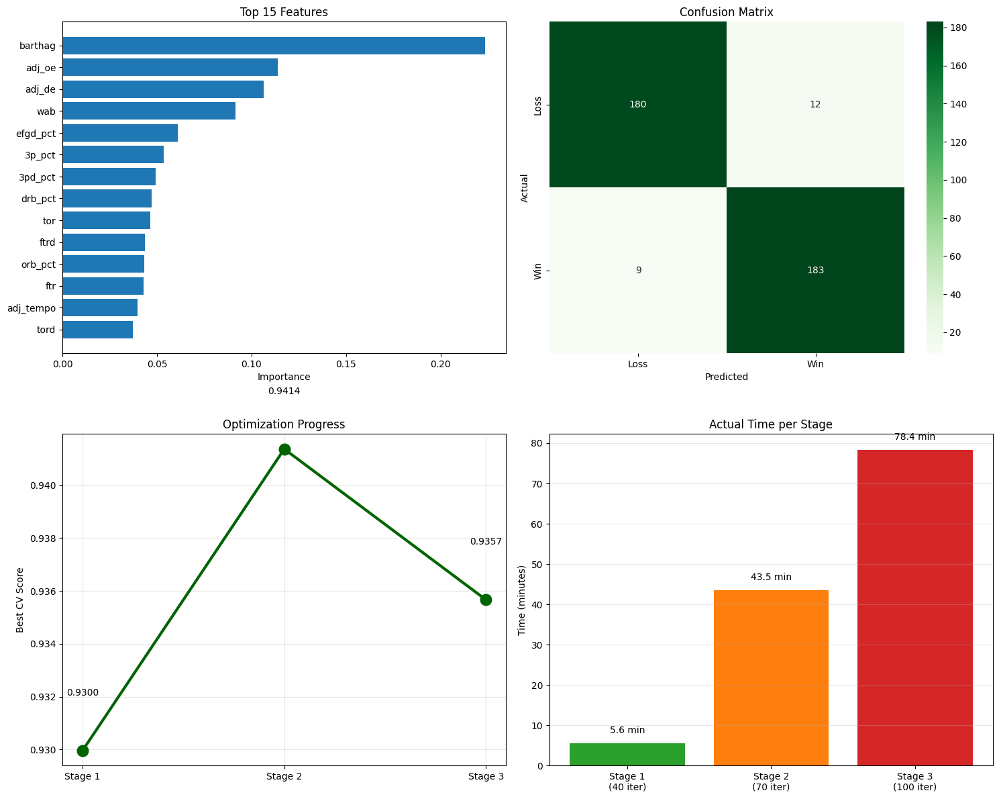


FINAL SUMMARY
Total combinations: 3500
Total fits: 14000
ACTUAL Total Time: 127.5 minutes (2.12 hours)

Stage breakdown:
  Stage 1: 5.6 min (0.09 hrs)
  Stage 2: 43.5 min (0.73 hrs)
  Stage 3: 78.4 min (1.31 hrs)

Test Accuracy: 0.9453 (94.53%)
Train-Test Gap: 0.0531
CV Stability: 0.0093

🎯 SUCCESS: Great model!

3-STAGE XGBoost COMPLETE! 🚀


In [6]:
# =============================================================================
# FINAL EVALUATION
# =============================================================================
print("\n" + "="*80)
print("TRAINING FINAL MODEL WITH EARLY STOPPING")
print("="*80 + "\n")

best_params_final = random_search_stage3.best_params_.copy()

final_model = xgb.XGBClassifier(
    **best_params_final,
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

final_model.fit(
    X_train_scaled, y_train,
    eval_set=[(X_train_scaled, y_train), (X_val_scaled, y_val)],
    verbose=False
)

print(f"Final model trained")

best_xgb = final_model

print("\n" + "="*80)
print("FINAL MODEL EVALUATION")
print("="*80 + "\n")

y_train_pred = best_xgb.predict(X_train_scaled)
y_val_pred = best_xgb.predict(X_val_scaled)
y_test_pred = best_xgb.predict(X_test_scaled)

train_accuracy = accuracy_score(y_train, y_train_pred)
val_accuracy = accuracy_score(y_val, y_val_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Performance Across All Stages:")
print(f"  Stage 1 CV: {random_search_stage1.best_score_:.4f}")
print(f"  Stage 2 CV: {random_search_stage2.best_score_:.4f}")
print(f"  Stage 3 CV: {random_search_stage3.best_score_:.4f}")
print(f"  Total Improvement: {random_search_stage3.best_score_ - random_search_stage1.best_score_:.4f}")

print(f"\nFinal Model Performance:")
print(f"  Training:   {train_accuracy:.4f} ({train_accuracy*100:.2f}%)")
print(f"  Validation: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
print(f"  Test:       {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")

print(f"\nOverfitting Analysis:")
print(f"  Train-Val Gap:  {train_accuracy - val_accuracy:.4f} ({(train_accuracy - val_accuracy)*100:.2f}%)")
print(f"  Train-Test Gap: {train_accuracy - test_accuracy:.4f} ({(train_accuracy - test_accuracy)*100:.2f}%)")

if train_accuracy - test_accuracy > 0.10:
    print("\n⚠️  SEVERE: Significant overfitting (>10%)")
elif train_accuracy - test_accuracy > 0.05:
    print("\n⚠️  WARNING: Moderate overfitting (5-10%)")
else:
    print("\n✓ Good generalization!")

print(f"\n{'='*80}")
print("Classification Report (Test):")
print("="*80)
print(classification_report(y_test, y_test_pred))

cm = confusion_matrix(y_test, y_test_pred)
print(f"\nConfusion Matrix:")
print(f"                 Predicted")
print(f"                Loss    Win")
print(f"Actual Loss     {cm[0,0]:4d}   {cm[0,1]:4d}")
print(f"       Win      {cm[1,0]:4d}   {cm[1,1]:4d}")

cv_scores = cross_val_score(best_xgb, X_train_scaled, y_train, cv=5, scoring='accuracy')
print(f"\n5-Fold CV: {cv_scores}")
print(f"Mean: {cv_scores.mean():.4f} | Std: {cv_scores.std():.4f}")

if cv_scores.std() > 0.05:
    print("⚠️  High variance")
else:
    print("✓ Stable model")

feature_importance = pd.DataFrame({
    'feature': features,
    'importance': best_xgb.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 Features:")
print(feature_importance.head(10).to_string(index=False))

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

top_features = feature_importance.head(15)
axes[0, 0].barh(range(len(top_features)), top_features['importance'])
axes[0, 0].set_yticks(range(len(top_features)))
axes[0, 0].set_yticklabels(top_features['feature'])
axes[0, 0].set_xlabel('Importance')
axes[0, 0].set_title('Top 15 Features')
axes[0, 0].invert_yaxis()

sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', cbar=True,
            xticklabels=['Loss', 'Win'], yticklabels=['Loss', 'Win'], ax=axes[0, 1])
axes[0, 1].set_title('Confusion Matrix')
axes[0, 1].set_ylabel('Actual')
axes[0, 1].set_xlabel('Predicted')

stage_scores = [
    random_search_stage1.best_score_,
    random_search_stage2.best_score_,
    random_search_stage3.best_score_
]
axes[1, 0].plot(['Stage 1', 'Stage 2', 'Stage 3'], stage_scores, marker='o', linewidth=3, markersize=12, color='darkgreen')
axes[1, 0].set_ylabel('Best CV Score')
axes[1, 0].set_title('Optimization Progress')
axes[1, 0].grid(True, alpha=0.3)
for i, score in enumerate(stage_scores):
    axes[1, 0].text(i, score + 0.002, f'{score:.4f}', ha='center', va='bottom')

stage_times = [stage1_time/60, stage2_time/60, stage3_time/60]
axes[1, 1].bar(['Stage 1\n(40 iter)', 'Stage 2\n(70 iter)', 'Stage 3\n(100 iter)'], stage_times, color=['#2ca02c', '#ff7f0e', '#d62728'])
axes[1, 1].set_ylabel('Time (minutes)')
axes[1, 1].set_title('Actual Time per Stage')
axes[1, 1].grid(True, alpha=0.3, axis='y')
for i, t in enumerate(stage_times):
    axes[1, 1].text(i, t + 2, f'{t:.1f} min', ha='center', va='bottom')

plt.tight_layout()
plt.show()

total_time = stage1_time + stage2_time + stage3_time
total_combinations = 500 + 1000 + 2000
total_fits = (500 * 4) + (1000 * 4) + (2000 * 4)

print(f"\n{'='*80}")
print("FINAL SUMMARY")
print("="*80)
print(f"Total combinations: {total_combinations}")
print(f"Total fits: {total_fits}")
print(f"ACTUAL Total Time: {total_time/60:.1f} minutes ({total_time/3600:.2f} hours)")
print(f"\nStage breakdown:")
print(f"  Stage 1: {stage1_time/60:.1f} min ({stage1_time/3600:.2f} hrs)")
print(f"  Stage 2: {stage2_time/60:.1f} min ({stage2_time/3600:.2f} hrs)")
print(f"  Stage 3: {stage3_time/60:.1f} min ({stage3_time/3600:.2f} hrs)")
print(f"\nTest Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"Train-Test Gap: {train_accuracy - test_accuracy:.4f}")
print(f"CV Stability: {cv_scores.std():.4f}")

if test_accuracy > 0.70 and train_accuracy - test_accuracy < 0.08:
    print(f"\n🎯 SUCCESS: Great model!")
elif test_accuracy > 0.65:
    print(f"\n✓ Good model")
else:
    print(f"\n⚠️  Could improve")

print("\n" + "="*80)
print("3-STAGE XGBoost COMPLETE! 🚀")
print("="*80)